In [1]:
import IPython
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import seaborn as sns
from IPython import get_ipython
import warnings
warnings.filterwarnings("ignore")


In [2]:
data=pd.read_csv("Crop_recommendation.csv")

In [3]:
data.head(5)
data

,N,P,K,temperature,humidity,ph,rainfall,label
0,90,42,43,20.879744,82.002744,6.502985,202.935536,rice
1,85,58,41,21.770462,80.319644,7.038096,226.655537,rice
2,60,55,44,23.004459,82.320763,7.840207,263.964248,rice
3,74,35,40,26.491096,80.158363,6.980401,242.864034,rice
4,78,42,42,20.130175,81.604873,7.628473,262.717340,rice
...,...,...,...,...,...,...,...,...
2195,107,34,32,26.774637,66.413269,6.780064,177.774507,coffee
2196,99,15,27,27.417112,56.636362,6.086922,127.924610,coffee
2197,118,33,30,24.131797,67.225123,6.362608,173.322839,coffee
2198,117,32,34,26.272418,52.127394,6.758793,127.175293,coffee


In [4]:
data.duplicated().sum()
#removes duplicate elements by data. drop_duplicates(keep=False) 

0

In [5]:
data.isnull().sum()
#null values in each column

N              0
P              0
K              0
temperature    0
humidity       0
ph             0
rainfall       0
label          0
dtype: int64

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2200 entries, 0 to 2199
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   N            2200 non-null   int64  
 1   P            2200 non-null   int64  
 2   K            2200 non-null   int64  
 3   temperature  2200 non-null   float64
 4   humidity     2200 non-null   float64
 5   ph           2200 non-null   float64
 6   rainfall     2200 non-null   float64
 7   label        2200 non-null   object 
dtypes: float64(4), int64(3), object(1)
memory usage: 137.6+ KB


In [7]:
data.describe()

,N,P,K,temperature,humidity,ph,rainfall
count,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000
mean,50.551818,53.362727,48.149091,25.616244,71.481779,6.469480,103.463655
std,36.917334,32.985883,50.647931,5.063749,22.263812,0.773938,54.958389
min,0.000000,5.000000,5.000000,8.825675,14.258040,3.504752,20.211267
25%,21.000000,28.000000,20.000000,22.769375,60.261953,5.971693,64.551686
50%,37.000000,51.000000,32.000000,25.598693,80.473146,6.425045,94.867624
75%,84.250000,68.000000,49.000000,28.561654,89.948771,6.923643,124.267508
max,140.000000,145.000000,205.000000,43.675493,99.981876,9.935091,298.560117


In [8]:
data.nunique()
#unique values in each column

N               137
P               117
K                73
temperature    2200
humidity       2200
ph             2200
rainfall       2200
label            22
dtype: int64

In [9]:
data['label'].unique()
#types of crops

array(['rice', 'maize', 'chickpea', 'kidneybeans', 'pigeonpeas',
       'mothbeans', 'mungbean', 'blackgram', 'lentil', 'pomegranate',
       'banana', 'mango', 'grapes', 'watermelon', 'muskmelon', 'apple',
       'orange', 'papaya', 'coconut', 'cotton', 'jute', 'coffee'],
      dtype=object)

In [10]:
data['label'].value_counts()
#count of each crop

rice           100
maize          100
jute           100
cotton         100
coconut        100
papaya         100
orange         100
apple          100
muskmelon      100
watermelon     100
grapes         100
mango          100
banana         100
pomegranate    100
lentil         100
blackgram      100
mungbean       100
mothbeans      100
pigeonpeas     100
kidneybeans    100
chickpea       100
coffee         100
Name: label, dtype: int64

In [11]:
crop_summary=pd.pivot_table(data,index=['label'],aggfunc='mean')
#pivot_table gives different columns mean of each crop
crop_summary

,K,N,P,humidity,ph,rainfall,temperature
label,,,,,,,
apple,199.89,20.80,134.22,92.333383,5.929663,112.654779,22.630942
banana,50.05,100.23,82.01,80.358123,5.983893,104.626980,27.376798
blackgram,19.24,40.02,67.47,65.118426,7.133952,67.884151,29.973340
chickpea,79.92,40.09,67.79,16.860439,7.336957,80.058977,18.872847
coconut,30.59,21.98,16.93,94.844272,5.976562,175.686646,27.409892
coffee,29.94,101.20,28.74,58.869846,6.790308,158.066295,25.540477
cotton,19.56,117.77,46.24,79.843474,6.912675,80.398043,23.988958
grapes,200.11,23.18,132.53,81.875228,6.025937,69.611829,23.849575
jute,39.99,78.40,46.86,79.639864,6.732778,174.792798,24.958376


In [12]:
fig=px.box(data, y="N",points="all")
fig.show()

In [13]:
fig=px.box(data, y="P",points="all")
fig.show()

In [14]:
fig=px.box(data, y="ph",points="all")
fig.show()

In [15]:
fig=px.box(data, y="rainfall",points="all")
fig.show()

In [16]:
fig=px.box(data, y="temperature",points="all")
fig.show()

In [17]:
fig=px.box(data, y="humidity",points="all")
fig.show()

In [18]:


# Remove Outliers
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3 - Q1
data_out = data[~((data < (Q1 - 1.5 * IQR)) |(data > (Q3 + 1.5 * IQR))).any(axis=1)]


In [19]:
data_out

,N,P,K,temperature,humidity,ph,rainfall,label
0,90,42,43,20.879744,82.002744,6.502985,202.935536,rice
13,93,56,36,24.014976,82.056872,6.984354,185.277339,rice
14,94,50,37,25.665852,80.663850,6.948020,209.586971,rice
17,91,35,39,23.793920,80.418180,6.970860,206.261186,rice
20,89,45,36,21.325042,80.474764,6.442475,185.497473,rice
...,...,...,...,...,...,...,...,...
2195,107,34,32,26.774637,66.413269,6.780064,177.774507,coffee
2196,99,15,27,27.417112,56.636362,6.086922,127.924610,coffee
2197,118,33,30,24.131797,67.225123,6.362608,173.322839,coffee
2198,117,32,34,26.272418,52.127394,6.758793,127.175293,coffee


In [20]:
fig=px.box(data_out, y="temperature",points="all")
fig.show()

In [21]:
data_out.corr()

,N,P,K,temperature,humidity,ph,rainfall
N,1.000000,-0.084996,0.343172,-0.022925,0.263791,0.091578,-0.021797
P,-0.084996,1.000000,-0.052944,-0.068690,-0.470329,-0.003966,-0.017827
K,0.343172,-0.052944,1.000000,-0.084430,0.059263,0.010826,-0.020435
temperature,-0.022925,-0.068690,-0.084430,1.000000,0.247642,-0.030254,-0.093072
humidity,0.263791,-0.470329,0.059263,0.247642,1.000000,0.138226,-0.030023
ph,0.091578,-0.003966,0.010826,-0.030254,0.138226,1.000000,-0.152062
rainfall,-0.021797,-0.017827,-0.020435,-0.093072,-0.030023,-0.152062,1.000000


In [22]:
data_out.describe()

,N,P,K,temperature,humidity,ph,rainfall
count,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000
mean,54.332014,44.850679,31.715498,25.836913,70.114374,6.481933,98.002216
std,38.436640,22.624973,15.717006,4.168810,21.818135,0.681211,48.275844
min,0.000000,5.000000,5.000000,14.343205,15.755940,4.546466,20.211267
25%,22.000000,25.000000,19.000000,23.411834,58.245751,6.026821,59.413838
50%,40.000000,45.000000,26.000000,25.944613,76.734802,6.466501,93.521200
75%,90.000000,63.000000,44.000000,28.572096,88.165800,6.932295,122.063586
max,140.000000,95.000000,85.000000,37.131650,99.981876,8.340398,213.356092


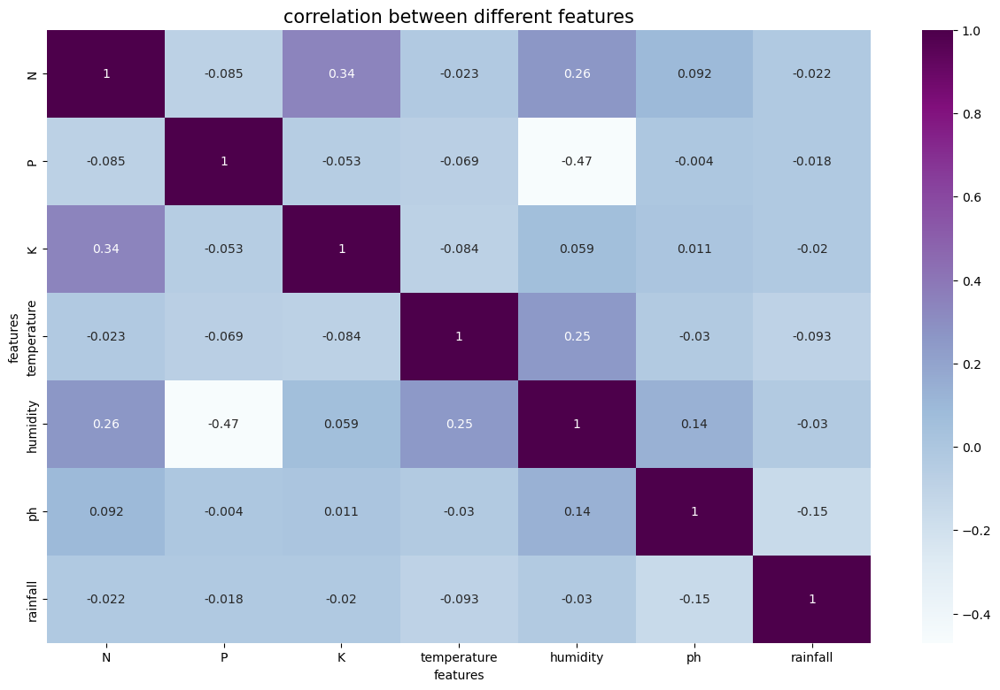

In [23]:
fig,ax=plt.subplots(1,1,figsize=(15,9))
sns.heatmap(data_out.corr(),cmap="BuPu",annot=True)
ax.set(xlabel='features')
ax.set(ylabel='features')
plt.title('correlation between different features',fontsize=15,c='black')
plt.show()

In [24]:
features = data_out[['N', 'P','K','temperature', 'humidity', 'ph', 'rainfall']]
target = data_out['label']
labels = data_out['label']

In [25]:
y = pd.get_dummies(target)#encoding label items that will be useful in predicting the outcome in a efficient way with less time complexity
y

,banana,blackgram,chickpea,coconut,coffee,cotton,jute,kidneybeans,lentil,maize,mango,mothbeans,mungbean,muskmelon,orange,papaya,pigeonpeas,pomegranate,rice,watermelon
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
13,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
14,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
17,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2195,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2196,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2197,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2198,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [26]:
data_out['label'].value_counts()

banana         100
lentil         100
jute           100
cotton         100
muskmelon      100
watermelon     100
maize          100
pomegranate    100
coffee         100
blackgram      100
mungbean       100
pigeonpeas     100
kidneybeans    100
mango           98
coconut         85
orange          83
mothbeans       58
chickpea        58
papaya          54
rice            32
Name: label, dtype: int64

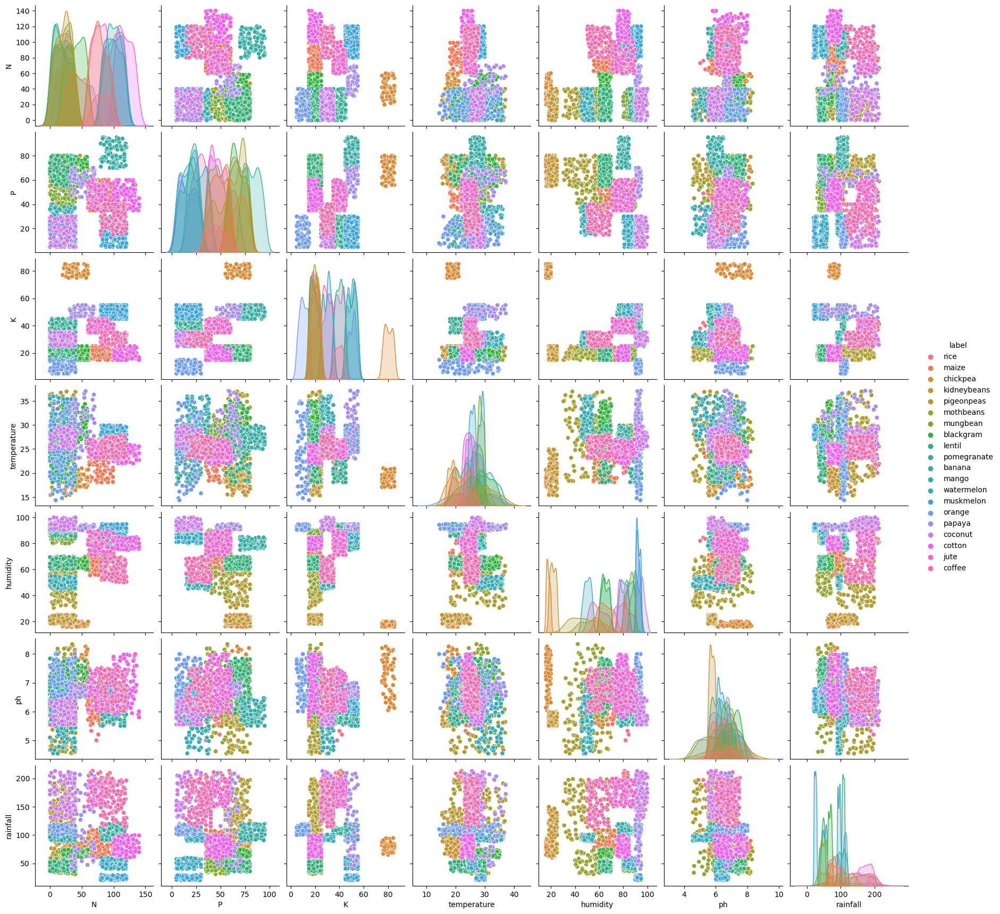

In [27]:

sns.pairplot(data_out,hue='label')#showing relation between pair of relations
plt.show()

In [28]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
data_scale=scaler.fit_transform(features)
standardized_data=pd.DataFrame(data_scale,columns=['N', 'P','K','temperature', 'humidity', 'ph', 'rainfall'])
standardized_data

,N,P,K,temperature,humidity,ph,rainfall
0,0.928231,-0.126033,0.718184,-1.189446,0.545039,0.030913,2.174235
1,1.006304,0.492928,0.272680,-0.437164,0.547521,0.737749,1.808354
2,1.032328,0.227659,0.336323,-0.041045,0.483656,0.684397,2.312053
3,0.954255,-0.435513,0.463610,-0.490205,0.472392,0.717935,2.243143
4,0.902207,0.006602,0.272680,-1.082599,0.474987,-0.057939,1.812915
...,...,...,...,...,...,...,...
1763,1.370642,-0.479724,0.018107,0.225002,-0.169682,0.437772,1.652894
1764,1.162449,-1.319742,-0.300110,0.379160,-0.617918,-0.580030,0.619997
1765,1.656909,-0.523936,-0.109180,-0.409133,-0.132462,-0.175216,1.560655
1766,1.630884,-0.568147,0.145393,0.104497,-0.824638,0.406537,0.604471


In [29]:
standardized_data.describe().round(3)

,N,P,K,temperature,humidity,ph,rainfall
count,1768.000,1768.000,1768.000,1768.000,1768.000,1768.000,1768.000
mean,-0.000,0.000,-0.000,0.000,-0.000,0.000,-0.000
std,1.000,1.000,1.000,1.000,1.000,1.000,1.000
min,-1.414,-1.762,-1.700,-2.758,-2.492,-2.842,-1.612
25%,-0.841,-0.878,-0.809,-0.582,-0.544,-0.668,-0.800
50%,-0.373,0.007,-0.364,0.026,0.304,-0.023,-0.093
75%,0.928,0.802,0.782,0.656,0.828,0.661,0.499
max,2.229,2.217,3.391,2.710,1.369,2.729,2.390


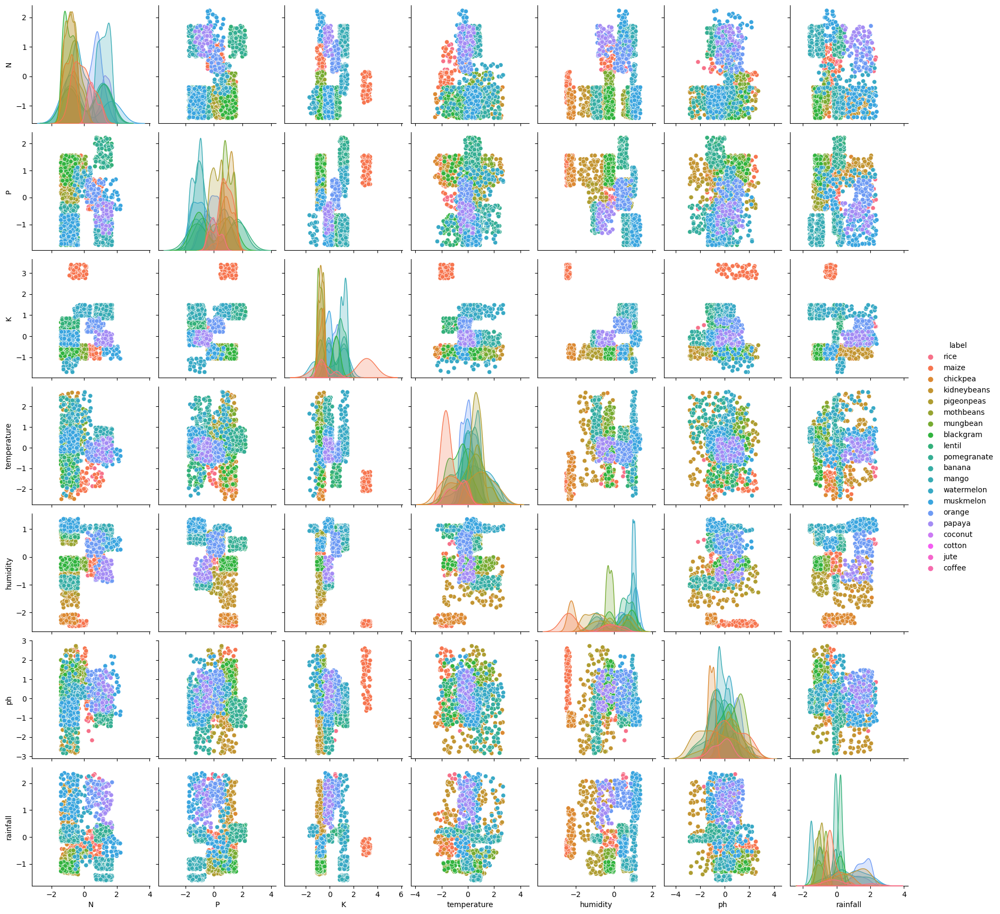

In [30]:
std_data=pd.concat([standardized_data,target],axis=1)
sns.pairplot(std_data,hue='label')

In [31]:
# Splitting into train and test data
from sklearn.model_selection import train_test_split
Xtrain,Xtest,Ytrain,Ytest=train_test_split(features,target,test_size=0.2,random_state=2)

In [32]:
#train model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, auc, roc_curve
from sklearn import metrics
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, StandardScaler, Normalizer, Binarizer, LabelEncoder

In [33]:
# Import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score

def apply_all_algorithms1(data):
    # Split the dataset into features and target variable
    X = data.drop('label', axis=1)
    y = data['label']
    
    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
    
    # Create a list of classification algorithms to apply
    classifiers = [
        ('Decision Tree', DecisionTreeClassifier()),
        ('Logistic Regression', LogisticRegression()),
        ('Random Forest', RandomForestClassifier()),
        ('SVM', SVC()),
        ('K-Nearest Neighbors', KNeighborsClassifier()),
        ('Naive Bayes', GaussianNB())
    ]
    
    # Loop through the list of classifiers and apply each one to the dataset
    for name, classifier in classifiers:
        # Train the classifier on the training set
        classifier.fit(X_train, y_train)
        
        # Make predictions on the testing set
        y_pred = classifier.predict(X_test)
        
        # Calculate the accuracy score
        accuracy = accuracy_score(y_test, y_pred)
        
        # Print the accuracy score for the classifier
        print("{} Accuracy: {}".format(name, accuracy))

In [34]:
apply_all_algorithms1(data)

Decision Tree Accuracy: 0.9840909090909091
Logistic Regression Accuracy: 0.9590909090909091
Random Forest Accuracy: 0.9977272727272727
SVM Accuracy: 0.9659090909090909
K-Nearest Neighbors Accuracy: 0.9681818181818181
Naive Bayes Accuracy: 0.990909090909091


In [35]:
acc=[]
model=[]
X_train, X_test, y_train, y_test =train_test_split(features,target,test_size=0.2,random_state=2)

# DECISION TREE

In [36]:
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
DescisionTree = DecisionTreeClassifier()
DescisionTree.fit(X_train,y_train)
predicted_values = DescisionTree.predict(X_test)
x = metrics.accuracy_score(y_test,predicted_values)
acc.append(x)
model.append('Decision Tree')
print("DecisionTrees's Accuracy is: ", x*100)
print(classification_report(Ytest,predicted_values))

DecisionTrees's Accuracy is:  99.15254237288136
              precision    recall  f1-score   support

      banana       0.93      1.00      0.96        13
   blackgram       1.00      1.00      1.00        19
    chickpea       1.00      1.00      1.00        13
     coconut       1.00      1.00      1.00        20
      coffee       1.00      1.00      1.00        23
      cotton       1.00      0.96      0.98        26
        jute       1.00      1.00      1.00        14
 kidneybeans       1.00      1.00      1.00        19
      lentil       1.00      0.95      0.97        20
       maize       0.95      1.00      0.98        20
       mango       1.00      1.00      1.00        13
   mothbeans       0.88      1.00      0.93         7
    mungbean       1.00      1.00      1.00        29
   muskmelon       1.00      1.00      1.00        21
      orange       1.00      1.00      1.00        25
      papaya       1.00      0.89      0.94         9
  pigeonpeas       1.00      1.00

In [37]:
train_acc =DescisionTree.score(X_train, y_train)
test_acc = DescisionTree.score(X_test, y_test)

print(f"Training accuracy: {train_acc}")
print(f"Testing accuracy: {test_acc}")

Training accuracy: 1.0
Testing accuracy: 0.9915254237288136


In [38]:
cross_val_score(DescisionTree,features,target,cv=5)

array([0.98870056, 0.98305085, 0.98022599, 0.98866856, 0.97450425])

# GUASSIAN NAIVE BAYES 

In [39]:
from sklearn.naive_bayes import GaussianNB

NaiveBayes = GaussianNB()
NaiveBayes.fit(Xtrain,Ytrain)
predicted_values = NaiveBayes.predict(Xtest)

x = metrics.accuracy_score(Ytest, predicted_values)
acc.append(x)
model.append('Naive Bayes')
print("Naive Bayes's Accuracy is: ", x)

print(classification_report(Ytest,predicted_values))

Naive Bayes's Accuracy is:  0.9943502824858758
              precision    recall  f1-score   support

      banana       1.00      1.00      1.00        13
   blackgram       1.00      1.00      1.00        19
    chickpea       1.00      1.00      1.00        13
     coconut       1.00      1.00      1.00        20
      coffee       1.00      1.00      1.00        23
      cotton       1.00      1.00      1.00        26
        jute       1.00      0.86      0.92        14
 kidneybeans       1.00      1.00      1.00        19
      lentil       1.00      1.00      1.00        20
       maize       1.00      1.00      1.00        20
       mango       1.00      1.00      1.00        13
   mothbeans       1.00      1.00      1.00         7
    mungbean       1.00      1.00      1.00        29
   muskmelon       1.00      1.00      1.00        21
      orange       1.00      1.00      1.00        25
      papaya       1.00      1.00      1.00         9
  pigeonpeas       1.00      1.00 

In [40]:
cross_val_score(NaiveBayes,features,target,cv=5)

array([0.99152542, 0.98870056, 0.99435028, 0.98866856, 0.98583569])

# SUPPORT VECTOR MACHINE(SVM)

In [41]:
from sklearn.svm import SVC
# data normalization with sklearn
from sklearn.preprocessing import MinMaxScaler
li=[]
SVM = SVC(kernel='poly', degree=4, C=1)
SVM.fit(Xtrain,Ytrain)
predicted_values = SVM.predict(Xtest)
x = metrics.accuracy_score(Ytest, predicted_values)
li.append(x)
print("SVM's Accuracy is: ", x)

print(classification_report(Ytest,predicted_values))

SVM's Accuracy is:  0.9943502824858758
              precision    recall  f1-score   support

      banana       1.00      1.00      1.00        13
   blackgram       1.00      1.00      1.00        19
    chickpea       1.00      1.00      1.00        13
     coconut       1.00      1.00      1.00        20
      coffee       1.00      1.00      1.00        23
      cotton       1.00      1.00      1.00        26
        jute       0.93      1.00      0.97        14
 kidneybeans       1.00      1.00      1.00        19
      lentil       0.95      1.00      0.98        20
       maize       1.00      1.00      1.00        20
       mango       1.00      1.00      1.00        13
   mothbeans       1.00      0.86      0.92         7
    mungbean       1.00      1.00      1.00        29
   muskmelon       1.00      1.00      1.00        21
      orange       1.00      1.00      1.00        25
      papaya       1.00      1.00      1.00         9
  pigeonpeas       1.00      1.00      1.0

In [42]:
cross_val_score(SVM,features,target,cv=5)

array([0.97457627, 0.97457627, 0.97740113, 0.97733711, 0.98016997])

In [43]:
# from sklearn.svm import SVC
# data normalization with sklearn
from sklearn.preprocessing import MinMaxScaler
# fit scaler on training data
norm = MinMaxScaler().fit(Xtrain)
X_train_norm = norm.transform(Xtrain)
# transform testing dataabs
X_test_norm = norm.transform(Xtest)
SVM_n = SVC(kernel='poly', degree=3, C=1)
SVM_n.fit(X_train_norm,Ytrain)
predicted_values = SVM_n.predict(X_test_norm)
x = metrics.accuracy_score(Ytest, predicted_values)
li.append(x)

print("SVM's Accuracy is: ", x)

print(classification_report(Ytest,predicted_values))

SVM's Accuracy is:  0.9858757062146892
              precision    recall  f1-score   support

      banana       1.00      1.00      1.00        13
   blackgram       0.83      1.00      0.90        19
    chickpea       1.00      1.00      1.00        13
     coconut       1.00      1.00      1.00        20
      coffee       1.00      1.00      1.00        23
      cotton       1.00      1.00      1.00        26
        jute       0.93      1.00      0.97        14
 kidneybeans       1.00      1.00      1.00        19
      lentil       1.00      0.95      0.97        20
       maize       1.00      1.00      1.00        20
       mango       1.00      1.00      1.00        13
   mothbeans       1.00      0.86      0.92         7
    mungbean       1.00      1.00      1.00        29
   muskmelon       1.00      1.00      1.00        21
      orange       1.00      1.00      1.00        25
      papaya       1.00      1.00      1.00         9
  pigeonpeas       1.00      0.90      0.9

In [44]:
cross_val_score(SVM_n,features,target,cv=5)

array([0.97457627, 0.97740113, 0.98870056, 0.97733711, 0.98016997])

In [45]:
from sklearn.svm import SVC
# data normalization with sklearn
from sklearn.preprocessing import StandardScaler
# fit scaler on training data
norm =  StandardScaler().fit(Xtrain)
X_train_norm = norm.transform(Xtrain)
# transform testing dataabs
X_test_norm = norm.transform(Xtest)
SVM_s = SVC(kernel='poly', degree=3, C=1)
SVM_s.fit(X_train_norm,Ytrain)
predicted_values = SVM_s.predict(X_test_norm)
x = metrics.accuracy_score(Ytest, predicted_values)
li.append(x)
print("SVM's Accuracy is: ", x)

print(classification_report(Ytest,predicted_values))

SVM's Accuracy is:  0.963276836158192
              precision    recall  f1-score   support

      banana       1.00      1.00      1.00        13
   blackgram       0.86      0.95      0.90        19
    chickpea       1.00      1.00      1.00        13
     coconut       1.00      1.00      1.00        20
      coffee       1.00      0.83      0.90        23
      cotton       1.00      0.88      0.94        26
        jute       0.93      1.00      0.97        14
 kidneybeans       1.00      1.00      1.00        19
      lentil       1.00      0.95      0.97        20
       maize       0.69      1.00      0.82        20
       mango       1.00      0.92      0.96        13
   mothbeans       1.00      1.00      1.00         7
    mungbean       1.00      1.00      1.00        29
   muskmelon       1.00      1.00      1.00        21
      orange       1.00      1.00      1.00        25
      papaya       1.00      1.00      1.00         9
  pigeonpeas       1.00      0.90      0.95

In [46]:
cross_val_score(SVM_s,features,target,cv=5)

array([0.97457627, 0.97740113, 0.98870056, 0.97733711, 0.98016997])

In [47]:
acc.append(max(li))
model.append('SVM')

# LOGISTIC REGRESSION

In [48]:
from sklearn.linear_model import LogisticRegression

LogReg = LogisticRegression(random_state=2)
LogReg.fit(Xtrain,Ytrain)
predicted_values = LogReg.predict(Xtest)

x = metrics.accuracy_score(Ytest, predicted_values)
acc.append(x)
model.append('Logistic Regression')
print("Logistic Regression's Accuracy is: ", x)

print(classification_report(Ytest,predicted_values))

Logistic Regression's Accuracy is:  0.963276836158192
              precision    recall  f1-score   support

      banana       1.00      1.00      1.00        13
   blackgram       0.85      0.89      0.87        19
    chickpea       1.00      1.00      1.00        13
     coconut       1.00      1.00      1.00        20
      coffee       1.00      1.00      1.00        23
      cotton       0.86      0.96      0.91        26
        jute       1.00      0.93      0.96        14
 kidneybeans       1.00      1.00      1.00        19
      lentil       0.95      0.90      0.92        20
       maize       0.89      0.80      0.84        20
       mango       1.00      1.00      1.00        13
   mothbeans       0.71      0.71      0.71         7
    mungbean       1.00      0.97      0.98        29
   muskmelon       1.00      1.00      1.00        21
      orange       1.00      1.00      1.00        25
      papaya       1.00      1.00      1.00         9
  pigeonpeas       1.00    

In [49]:
cross_val_score(LogReg,features,target,cv=5)

array([0.95480226, 0.95762712, 0.96327684, 0.9631728 , 0.94050992])

# RANDOM FOREST

In [50]:
from sklearn.ensemble import RandomForestClassifier

RF = RandomForestClassifier(n_estimators=8)
RF.fit(Xtrain,Ytrain)

predicted_values = RF.predict(Xtest)

x = metrics.accuracy_score(Ytest, predicted_values)
acc.append(x)
model.append('RF')
print("RF's Accuracy is: ", x)

print(classification_report(Ytest,predicted_values))

RF's Accuracy is:  0.9971751412429378
              precision    recall  f1-score   support

      banana       0.93      1.00      0.96        13
   blackgram       1.00      1.00      1.00        19
    chickpea       1.00      1.00      1.00        13
     coconut       1.00      1.00      1.00        20
      coffee       1.00      1.00      1.00        23
      cotton       1.00      1.00      1.00        26
        jute       1.00      1.00      1.00        14
 kidneybeans       1.00      1.00      1.00        19
      lentil       1.00      1.00      1.00        20
       maize       1.00      1.00      1.00        20
       mango       1.00      1.00      1.00        13
   mothbeans       1.00      1.00      1.00         7
    mungbean       1.00      1.00      1.00        29
   muskmelon       1.00      1.00      1.00        21
      orange       1.00      1.00      1.00        25
      papaya       1.00      0.89      0.94         9
  pigeonpeas       1.00      1.00      1.00

In [51]:
train_acc =RF.score(X_train, y_train)
test_acc = RF.score(X_test, y_test)

print(f"Training accuracy: {train_acc}")
print(f"Testing accuracy: {test_acc}")

Training accuracy: 1.0
Testing accuracy: 0.9971751412429378


In [52]:
scores = cross_val_score(RF, X_train, y_train, cv=5)

# Print the average score and standard deviation
print("Average score: {:.2f}".format(scores.mean()))
print("Standard deviation: {:.2f}".format(scores.std()))


Average score: 0.98
Standard deviation: 0.00


In [53]:

# Define the range of values for n_estimators
n_estimators_range = [2,5,8]

# Initialize an empty list to store the mean accuracy scores
mean_accuracy_scores = []

# Perform k-fold cross-validation for each value of n_estimators
for n_estimators in n_estimators_range:
    rf = RandomForestClassifier(n_estimators=n_estimators)
    scores = cross_val_score(rf, features, target, cv=5)
    mean_accuracy_scores.append(scores.mean())

# Find the optimal value of n_estimators
optimal_n_estimators = n_estimators_range[mean_accuracy_scores.index(max(mean_accuracy_scores))]

# Print the optimal value of n_estimators
print("Optimal n_estimators:", optimal_n_estimators)

Optimal n_estimators: 8


In [54]:
cross_val_score(RF,features,target,cv=8)

array([0.98642534, 1.        , 0.98642534, 0.99547511, 0.99095023,
       0.97737557, 0.98642534, 0.97737557])

[Text(41.972222222222214, 0.5, 'Ytest')]

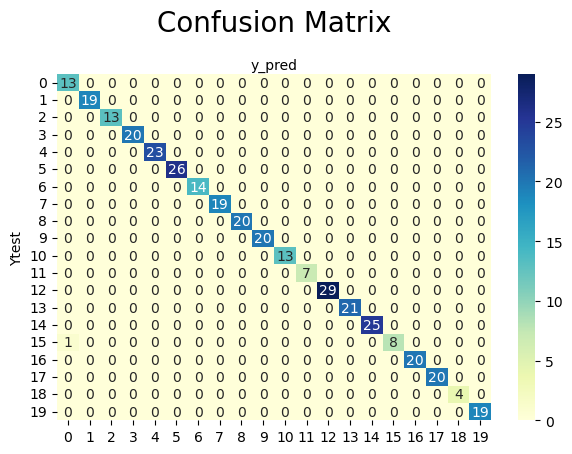

In [55]:
#confusion matrix
conf_matrix=confusion_matrix(Ytest,predicted_values)
fig,ax = plt.subplots(figsize=(6,4))
sns.heatmap(pd.DataFrame(conf_matrix), annot = True, cmap = 'YlGnBu',fmt = 'g')
ax.xaxis.set_label_position('top')
plt.tight_layout()
plt.title('Confusion Matrix', fontsize=20, y=1.1)
ax.set(xlabel='y_pred')
ax.set(ylabel='Ytest')

# K-Nearest Neighbors

In [56]:
from sklearn.neighbors import KNeighborsClassifier
# data normalization with sklearn
from sklearn.preprocessing import MinMaxScaler
KNN = KNeighborsClassifier()
KNN.fit(Xtrain,Ytrain)
predicted_values = KNN.predict(Xtest)
x = metrics.accuracy_score(Ytest, predicted_values)
acc.append(x)
model.append('KNN')
print("KNN's Accuracy is: ", x)

print(classification_report(Ytest,predicted_values))

KNN's Accuracy is:  0.980225988700565
              precision    recall  f1-score   support

      banana       1.00      1.00      1.00        13
   blackgram       0.95      1.00      0.97        19
    chickpea       1.00      1.00      1.00        13
     coconut       1.00      1.00      1.00        20
      coffee       1.00      1.00      1.00        23
      cotton       0.96      1.00      0.98        26
        jute       0.81      0.93      0.87        14
 kidneybeans       1.00      1.00      1.00        19
      lentil       0.95      0.95      0.95        20
       maize       1.00      0.95      0.97        20
       mango       1.00      1.00      1.00        13
   mothbeans       1.00      0.86      0.92         7
    mungbean       1.00      1.00      1.00        29
   muskmelon       1.00      1.00      1.00        21
      orange       1.00      1.00      1.00        25
      papaya       1.00      1.00      1.00         9
  pigeonpeas       1.00      1.00      1.00

In [57]:
from sklearn.neighbors import KNeighborsClassifier
# data normalization with sklearn
from sklearn.preprocessing import MinMaxScaler
# fit scaler on training data KNeighborsClassifier
norm = MinMaxScaler().fit(Xtrain)
X_train_norm = norm.transform(Xtrain)
#transform testing dataabs
X_test_norm = norm.transform(Xtest)
#kernel='poly', degree=3, C=1 underatand where to use it
KNN = KNeighborsClassifier()
KNN.fit(X_train_norm,Ytrain)
predicted_values = KNN.predict(X_test_norm)
x = metrics.accuracy_score(Ytest, predicted_values)
acc.append(x)
model.append('KNN')
print("KNN's Accuracy is: ", x)

print(classification_report(Ytest,predicted_values))

KNN's Accuracy is:  0.9887005649717514
              precision    recall  f1-score   support

      banana       1.00      1.00      1.00        13
   blackgram       0.90      1.00      0.95        19
    chickpea       1.00      1.00      1.00        13
     coconut       1.00      1.00      1.00        20
      coffee       1.00      1.00      1.00        23
      cotton       0.96      1.00      0.98        26
        jute       1.00      1.00      1.00        14
 kidneybeans       0.95      1.00      0.97        19
      lentil       1.00      0.95      0.97        20
       maize       1.00      0.95      0.97        20
       mango       1.00      1.00      1.00        13
   mothbeans       1.00      1.00      1.00         7
    mungbean       1.00      1.00      1.00        29
   muskmelon       1.00      1.00      1.00        21
      orange       1.00      1.00      1.00        25
      papaya       1.00      1.00      1.00         9
  pigeonpeas       1.00      0.90      0.9

In [58]:
from sklearn.neighbors import KNeighborsClassifier
# data normalization with sklearn
from sklearn.preprocessing import StandardScaler
# fit scaler on training data KNeighborsClassifier
norm = StandardScaler().fit(Xtrain)
X_train_norm = norm.transform(Xtrain)
#transform testing dataabs
X_test_norm = norm.transform(Xtest)
#kernel='poly', degree=3, C=1 underatand where to use it
KNN = KNeighborsClassifier()
KNN.fit(X_train_norm,Ytrain)
predicted_values = KNN.predict(X_test_norm)
x = metrics.accuracy_score(Ytest, predicted_values)
acc.append(x)
model.append('KNN')
print("KNN's Accuracy is: ", x)

print(classification_report(Ytest,predicted_values))

KNN's Accuracy is:  0.9830508474576272
              precision    recall  f1-score   support

      banana       1.00      1.00      1.00        13
   blackgram       0.86      1.00      0.93        19
    chickpea       1.00      1.00      1.00        13
     coconut       1.00      1.00      1.00        20
      coffee       1.00      1.00      1.00        23
      cotton       0.96      1.00      0.98        26
        jute       0.93      1.00      0.97        14
 kidneybeans       0.95      1.00      0.97        19
      lentil       1.00      0.90      0.95        20
       maize       1.00      0.95      0.97        20
       mango       1.00      1.00      1.00        13
   mothbeans       1.00      1.00      1.00         7
    mungbean       1.00      1.00      1.00        29
   muskmelon       1.00      1.00      1.00        21
      orange       1.00      1.00      1.00        25
      papaya       1.00      1.00      1.00         9
  pigeonpeas       1.00      0.90      0.9

# Accuracy Comparison

<AxesSubplot:title={'center':'Accuracy Comparison'}, xlabel='Accuracy', ylabel='Algorithm'>

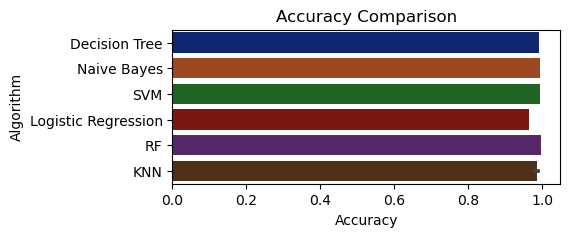

In [59]:
plt.figure(figsize=[5,2],dpi = 100)
plt.title('Accuracy Comparison')
plt.xlabel('Accuracy')
plt.ylabel('Algorithm')
sns.barplot(x = acc,y = model,palette='dark')


In [60]:
accuracy_models = dict(zip(model, acc))
for k, v in accuracy_models.items():
    print (k, '-->', v)

Decision Tree --> 0.9915254237288136
Naive Bayes --> 0.9943502824858758
SVM --> 0.9943502824858758
Logistic Regression --> 0.963276836158192
RF --> 0.9971751412429378
KNN --> 0.9830508474576272


In [61]:
def model(data,classifier):
    prediction=classifier.predict(data)
    return prediction[0]

In [62]:
data=np.array([[90,42,43,21,82.002744,6,20]])
classifier=RF
pred=model(data,classifier)
pred

'muskmelon'

In [63]:
import pickle
# Dump the trained Naive Bayes classifier with Pickle
RF_pkl_filename = '../models/RandomForest1.pkl'
# Open the file to save as pkl file
RF_Model_pkl = open(RF_pkl_filename , 'wb')
pickle.dump(RF, RF_Model_pkl)
# Close the pickle instances
RF_Model_pkl.close()